In [1]:
import ipyvolume.pylab as p3
import numpy as np

In [2]:
%matplotlib inline

In [3]:
from ipyvolume import examples as ex
from ipyvolume import datasets as ds
from ipyvolume import quickvolshow as qs

In [4]:
import glob
import os
from readfiles import *
import matplotlib.pyplot as plt
import ipyvolume.pylab as p3
#import pandas as pd
import pyevtk as evtk
import numpy as np
import h5py
from lomapost import * #All functions defined within module lomapost
%matplotlib inline

In [5]:
set_fig_props()
#plt.rcParams['figure.figsize'] = (10.0, 8.0)
plt.rcParams['savefig.dpi'] = 300
#plt.rcParams['figure.facecolor'] = 'white'
#sizefont= 14
#font = {'family' : 'normal','weight' : 'normal','size'   : sizefont}
#plt.rc('font', **{'family': 'serif', 'serif': ['Computer Modern'],'size':sizefont})
#plt.rc('text', usetex=True)
#plt.rc('xtick', labelsize=sizefont)
#plt.rc('ytick', labelsize=sizefont)
#plt.rcParams['xtick.major.pad']='8'
#plt.rcParams['ytick.major.pad']='8'

In [6]:
from IPython.display import clear_output
from IPython.display import Image

In [7]:
from matplotlib import cm
from matplotlib.colors import BoundaryNorm
from matplotlib.ticker import MaxNLocator
from mpl_toolkits.axes_grid1 import make_axes_locatable
cmap = plt.get_cmap('PiYG')
cmap = plt.get_cmap('RdBu')

In [8]:
#from vispy import app
#from vispy import gloo
#import pyglet

In [8]:
#PROPERTIES FOR THE PLOTS

xlen=plt.rcParams['figure.figsize'][0]
xyratio=0.61
ylen = xyratio*xlen
#PRINT or not??
#PRINT = True
PRINT =False
save_folder='/share/drive/toni/VDML/JFM_SUBMISSION/'
fformat = '.tiff'
#fformat = '.eps'

In [9]:
#Names of the runs:
v_names = ['s10a','s20d','s40d','s80b']
#Path to the h5 files
p_stats = ['/share/drive/toni/VDML/s10/01/h5.stats','/share/drive/toni/VDML/s20/04/h5.stats', \
           '/share/drive/toni/VDML/s40/04/h5.stats','/share/drive/toni/VDML/s80/02/h5.stats']

if len(p_stats) != len(v_names):
    print "Check your lists..."

In [10]:
hist = {}
i = 0
for ph5 in p_stats:
    hist[v_names[i]]={}
    with h5py.File(ph5,"r") as f:
        hist[v_names[i]]['time'] = np.array(f['time'])
        hist[v_names[i]]['dm']   = np.array(f['dm'])
        hist[v_names[i]]['dw']   = np.array(f['dw'])
    i += 1

In [11]:
kk = 'kk.txt'

# Fields

In [12]:
#Creating paths to fields
p_root = '/home/toni/fields/VDML_JFM/'
v_nfield = [6,7,17,13]
s_var  = ['up','o3','Tf']
v_variables = ['u','o3','scal']#,'scal']
p_field = []
for j in range(len(v_names)):
    nfield = "%03d" % v_nfield[j]
    p_field.append(p_root+v_names[j]+'_'+nfield)
print p_field

['/home/toni/fields/VDML_JFM/s10a_006', '/home/toni/fields/VDML_JFM/s20d_007', '/home/toni/fields/VDML_JFM/s40d_017', '/home/toni/fields/VDML_JFM/s80b_013']


# Read fields and create slices for vtk conversion

In [13]:
from pyevtk.hl import gridToVTK
from pyevtk.hl import pointsToVTK

In [14]:
var1='up'
vs = [1.0,2.0,4,8];
#Take into account that the code gives \tilde{Z} and not Z.
ik = 0
nslices = 8; #Number of files to split the field
#Loop for the different fields we want to load
for p,name in zip(p_field,v_names): 
    #data={}#dictionary
    print "Working with p=%s  and name= %s"%(p,name)
    #data[name] = {} #Clean big buffer
    #
    #Read file with field
    path  = p + '.'+var1+'xz'
    print "Reading file = %s"%(path)
    time,x,y,jspecy,vy,z,wk0,Re = readxzfield(path)
    #Permute in order to have x-y-z
    wk = np.transpose(np.array(wk0),[1,2,0])
    wk0 = 0.0
    nnx, nny, nnz = np.shape(wk)
    print "Shape of field = ( %s, %s, %s)"%(nnx,nny,nnz)
    #
    #Now convert to vtk
    #Declare the root of the path
    path0 = "/share/drive/toni/VDML/vtkfields/"+name
    %mkdir -p $path0
    path0 = path0 + "/" + var1 + "_"
    print "Path root where vtk fields will be created: %s" %(path0)
    for i in range(1,nslices+1):
        path = path0 + "%03d"% (i)
        ind1 = (i-1)*nnx/nslices;
        ind2 = ind1 + nnx/nslices;
        print "Writing slice at: %s" %(path)
        print "Slice %s of %s, from index1 = %s, to index2=%s"%(i,nslices,ind1,ind2)
        npoints = nnx/nslices*nny*nnz
        field= np.reshape(wk[ind1:ind2,:,:],[npoints],order='F')
        #field= wk[ind1:ind2,:,:]
        gridToVTK(path, x[ind1:ind2], vy, z, pointData={var1 :field})
    ik += 1  
print "Process is finished!"    

Working with p=/home/toni/fields/VDML_JFM/s10a_006  and name= s10a
Reading file = /home/toni/fields/VDML_JFM/s10a_006.upxz
my=[851]
Shape of field = ( 1536, 1, 576)
Path root where vtk fields will be created: /share/drive/toni/VDML/vtkfields/s10a/up_
Writing slice at: /share/drive/toni/VDML/vtkfields/s10a/up_001
Slice 1 of 8, from index1 = 0, to index2=192
Writing slice at: /share/drive/toni/VDML/vtkfields/s10a/up_002
Slice 2 of 8, from index1 = 192, to index2=384
Writing slice at: /share/drive/toni/VDML/vtkfields/s10a/up_003
Slice 3 of 8, from index1 = 384, to index2=576
Writing slice at: /share/drive/toni/VDML/vtkfields/s10a/up_004
Slice 4 of 8, from index1 = 576, to index2=768
Writing slice at: /share/drive/toni/VDML/vtkfields/s10a/up_005
Slice 5 of 8, from index1 = 768, to index2=960
Writing slice at: /share/drive/toni/VDML/vtkfields/s10a/up_006
Slice 6 of 8, from index1 = 960, to index2=1152
Writing slice at: /share/drive/toni/VDML/vtkfields/s10a/up_007
Slice 7 of 8, from index1 =

In [15]:
# VERSION WITH OVERLAP
var1='pp'
vs = [1.0,2.0,4,8];
#Take into account that the code gives \tilde{Z} and not Z.
ik = 3
nslices = 8; #Number of files to split the field
#Loop for the different fields we want to load
#for p,name in zip(p_field,v_names): 
for p,name in zip([p_field[ik]],[v_names[ik]]): 
    #data={}#dictionary
    print "Working with p=%s  and name= %s"%(p,name)
    #data[name] = {} #Clean big buffer
    #
    #Read file with field
    path  = p + '.'+var1+'xz'
    print "Reading file = %s"%(path)
    time,x,y,jspecy,vy,z,wk0,Re = readxzfield(path)
    #Permute in order to have x-y-z
    smean = np.mean(wk0)
    srms = np.std(wk0)
    print "mean = %s, rms = %s"%(smean,srms)
    wk = np.transpose(np.array(wk0),[1,2,0])
    wk0 = 0.0
    nnx, nny, nnz = np.shape(wk)
    print "Shape of field = ( %s, %s, %s)"%(nnx,nny,nnz)
    #
    #Now convert to vtk
    #Declare the root of the path
    path0 = "/share/drive/toni/VDML/vtkfields/"+name
    %mkdir -p $path0
    path0 = path0 + "/" + var1 + "_"
    print "Path root where vtk fields will be created: %s" %(path0)
    
    i = 1
    path = path0 + "%03d"% (i)
    ind1 = (i-1)*nnx/nslices;
    ind2 = ind1 + nnx/nslices;
    print "Writing slice at: %s" %(path)
    print "Slice %s of %s, from index1 = %s, to index2=%s"%(i,nslices,ind1,ind2)
    npoints = nnx/nslices*nny*nnz
    field= np.reshape(wk[ind1:ind2,:,:],[npoints],order='F')
    #field= wk[ind1:ind2,:,:]
    gridToVTK(path, x[ind1:ind2], vy, z, pointData={var1 :field})
    for i in range(2,nslices+1):
        path = path0 + "%03d"% (i)
        ind1 = (i-1)*nnx/nslices-1;
        ind2 = ind1 + nnx/nslices+1;
        print "Writing slice at: %s" %(path)
        print "Slice %s of %s, from index1 = %s, to index2=%s"%(i,nslices,ind1,ind2)
        npoints = (nnx/nslices+1)*nny*nnz
        field= np.reshape(wk[ind1:ind2,:,:],[npoints],order='F')
        #field= wk[ind1:ind2,:,:]
        gridToVTK(path, x[ind1:ind2], vy, z, pointData={var1 :field})
    ik += 1  
print "Process is finished!"    

Working with p=/home/toni/fields/VDML_JFM/s80b_013  and name= s80b
Reading file = /home/toni/fields/VDML_JFM/s80b_013.ppxz
my=[851]
mean = -1.52282023444e-05, rms = 0.00354242390229
Shape of field = ( 1536, 400, 576)
Path root where vtk fields will be created: /share/drive/toni/VDML/vtkfields/s80b/pp_
Writing slice at: /share/drive/toni/VDML/vtkfields/s80b/pp_001
Slice 1 of 8, from index1 = 0, to index2=192


KeyboardInterrupt: 

In [56]:
var1='o3'
vs = [1.0,2.0,4,8];
#Take into account that the code gives \tilde{Z} and not Z.
ik = 0
nslices = 8; #Number of files to split the field
#Loop for the different fields we want to load
for p,name in zip(p_field,v_names): 
    #data={}#dictionary
    print "Working with p=%s  and name= %s"%(p,name)
    #data[name] = {} #Clean big buffer
    #
    #Read file with field
    path  = p + '.'+var1+'xz'
    print "Reading file = %s"%(path)
    time,x,y,jspecy,vy,z,wk0,Re = readxzfield(path)
    #Permute in order to have x-y-z
    wk = np.transpose(np.array(wk0),[1,2,0])
    wk0 = 0.0
    nnx, nny, nnz = np.shape(wk)
    print "Shape of field = ( %s, %s, %s)"%(nnx,nny,nnz)
    #
    #Now convert to vtk
    #Declare the root of the path
    path0 = "/share/drive/toni/VDML/vtkfields/"+name
    %mkdir -p $path0
    path0 = path0 + "/" + var1 + "_"
    print "Path root where vtk fields will be created: %s" %(path0)
    for i in range(1,nslices+1):
        path = path0 + "%03d"% (i)
        ind1 = (i-1)*nnx/nslices;
        ind2 = ind1 + nnx/nslices;
        print "Writing slice at: %s" %(path)
        print "Slice %s of %s, from index1 = %s, to index2=%s"%(i,nslices,ind1,ind2)
        npoints = nnx/nslices*nny*nnz
        field= np.reshape(wk[ind1:ind2,:,:],[npoints],order='F')
        #field= wk[ind1:ind2,:,:]
        gridToVTK(path, x[ind1:ind2], vy, z, pointData={var1 :field})
    ik += 1  
print "Process is finished!"    

Working with p=/home/toni/fields/VDML_JFM/s10a_006  and name= s10a
Reading file = /home/toni/fields/VDML_JFM/s10a_006.o3xz
my=[851]
Shape of field = ( 1536, 450, 576)
Path root where vtk fields will be created: /share/drive/toni/VDML/vtkfields/s10a/o3_
Writing slice at: /share/drive/toni/VDML/vtkfields/s10a/o3_001
Slice 1 of 8, from index1 = 0, to index2=192
Writing slice at: /share/drive/toni/VDML/vtkfields/s10a/o3_002
Slice 2 of 8, from index1 = 192, to index2=384
Writing slice at: /share/drive/toni/VDML/vtkfields/s10a/o3_003
Slice 3 of 8, from index1 = 384, to index2=576
Writing slice at: /share/drive/toni/VDML/vtkfields/s10a/o3_004
Slice 4 of 8, from index1 = 576, to index2=768
Writing slice at: /share/drive/toni/VDML/vtkfields/s10a/o3_005
Slice 5 of 8, from index1 = 768, to index2=960
Writing slice at: /share/drive/toni/VDML/vtkfields/s10a/o3_006
Slice 6 of 8, from index1 = 960, to index2=1152
Writing slice at: /share/drive/toni/VDML/vtkfields/s10a/o3_007
Slice 7 of 8, from index1

In [64]:
var1='Tf'; wantRHO=True
#wantRHO=True
var2write = 'rho'
vs = [1.0,2.0,4,8];
#Take into account that the code gives \tilde{Z} and not Z.
ik = 0
nslices = 8; #Number of files to split the field
#Loop for the different fields we want to load
for p,name in zip(p_field,v_names): 
    var2write = var1
    #data={}#dictionary
    print "Working with p=%s  and name= %s"%(p,name)
    #data[name] = {} #Clean big buffer
    #
    #Read file with field
    path  = p + '.'+var1+'xz'
    print "Reading file = %s"%(path)
    time,x,y,jspecy,vy,z,wk0,Re = readxzfield(path)
    #Permute in order to have x-y-z
    wk = np.transpose(np.array(wk0),[1,2,0])
    wk0 = 0.0
    nnx, nny, nnz = np.shape(wk)
    print "Shape of field = ( %s, %s, %s)"%(nnx,nny,nnz)
    #
    #Now convert to vtk
    if var1=='Tf' and wantRHO==True:
        if vs[ik] != 1.0: #For Scalar it makes no sense
            var2write = 'rho'
            print "Converting from T to 1/T (rho)"
        else:
            var2write=var1
    #Declare the root of the path
    path0 = "/share/drive/toni/VDML/vtkfields/"+name
    %mkdir -p $path0
    path0 = path0 + "/" +var2write + "_"
    print "Path root where vtk fields will be created: %s" %(path0)
    for i in range(1,nslices+1):
        path = path0 + "%03d"% (i)
        ind1 = (i-1)*nnx/nslices;
        ind2 = ind1 + nnx/nslices;
        print "Writing slice at: %s" %(path)
        print "Slice %s of %s, from index1 = %s, to index2=%s"%(i,nslices,ind1,ind2)
        npoints = nnx/nslices*nny*nnz
        field= np.reshape(wk[ind1:ind2,:,:],[npoints],order='F')
        if var1=='Tf' and wantRHO==True:
            if vs[ik] != 1.0: #For Scalar it makes no sense
                field = 1.0/field      
        #field= wk[ind1:ind2,:,:]
        gridToVTK(path, x[ind1:ind2], vy, z, pointData={var2write :field})
    ik += 1  
print "Process is finished!"    

Working with p=/home/toni/fields/VDML_JFM/s10a_006  and name= s10a
Reading file = /home/toni/fields/VDML_JFM/s10a_006.Tfxz
my=[851]
Shape of field = ( 1536, 450, 576)
Path root where vtk fields will be created: /share/drive/toni/VDML/vtkfields/s10a/Tf_
Writing slice at: /share/drive/toni/VDML/vtkfields/s10a/Tf_001
Slice 1 of 8, from index1 = 0, to index2=192
Writing slice at: /share/drive/toni/VDML/vtkfields/s10a/Tf_002
Slice 2 of 8, from index1 = 192, to index2=384
Writing slice at: /share/drive/toni/VDML/vtkfields/s10a/Tf_003
Slice 3 of 8, from index1 = 384, to index2=576
Writing slice at: /share/drive/toni/VDML/vtkfields/s10a/Tf_004
Slice 4 of 8, from index1 = 576, to index2=768
Writing slice at: /share/drive/toni/VDML/vtkfields/s10a/Tf_005
Slice 5 of 8, from index1 = 768, to index2=960
Writing slice at: /share/drive/toni/VDML/vtkfields/s10a/Tf_006
Slice 6 of 8, from index1 = 960, to index2=1152
Writing slice at: /share/drive/toni/VDML/vtkfields/s10a/Tf_007
Slice 7 of 8, from index1

In [61]:
3 != 4

True

# Crosswise velocity

In [9]:
data={}#dictionary
firsttime = True
var = 'vp'
#vy0 = np.multiply([0.0,0.5,0.5,0.5],[49.16, 48.96,51.36,46])
#vy0 = np.multiply([0.3,0.5,0.5,0.5],[49.16, 48.96,51.36,46])
ik = 0
for p,name in zip(p_field,v_names):
    path  = p + '.'+var+'yx'
    #firsttime = True
    print path
    data[name] = {}
    #time,x,y,jspecy,vy,z,wk,Re = read1yxplane(path)
    #time,x,y,jspecy,vy,z,wk,Re = read1yzplane(path)
    time,x,y,z,wk,Re = readyxplane(path)
    
    #wk = wk.reshape((len(z),len(x)))
    #data[var] = wk.reshape((len(x),len(z)))
    data[name][var] = np.array(wk) 
    #if var != 'scal':
    #    data['d'+var+'dz'] = (wk[:,2,:]-wk[:,0,:])/(2*np.diff(z)[1])
    data[name]['time'] = time
    data[name]['x']  = x
    data[name]['y']  = y
    data[name]['z']  = z
    data[name]['Re'] = Re
    data[name]['dw'] = np.interp(time,hist[name]['time'],hist[name]['dw'])
    data[name]['dm'] = np.interp(time,hist[name]['time'],hist[name]['dm'])
    print "For field %s:\n time = %s, dw=%s, dm=%s"%(name,time,data[name]['dw'],data[name]['dm'])
    ik += 1
    #firsttime  = False
wk=0.0

/home/toni/fields/VDML_JFM/s10a_006.vpyx
[ 0.0136295] [ 0.036319]


/share/drive/toni/python/modules/post/readfiles.py:3247: VisibleDeprecationWarning: converting an array with ndim > 0 to an index will result in an error in the future
  jspecy = np.zeros([nspec])


For field s10a:
 time = 399.842, dw=29.2303972998, dm=5.93922999025
/home/toni/fields/VDML_JFM/s20d_007.vpyx
[ 0.0136295] [ 0.036319]
For field s20d:
 time = 418.846, dw=30.7833095235, dm=5.70466377491
/home/toni/fields/VDML_JFM/s40d_017.vpyx
[ 0.0136295] [ 0.036319]
For field s40d:
 time = 455.564, dw=30.9288376628, dm=4.92549366359
/home/toni/fields/VDML_JFM/s80b_013.vpyx
[ 0.0136295] [ 0.036319]
For field s80b:
 time = 569.637, dw=31.5409215549, dm=4.27063772539


In [3]:
import numpy as np
vTmin = [0.,   7.50000000e-01 ,  6.25000000e-01,   5.62500000e-01]
vDT = [ 1.  ,    0.75 ,   1.875 ,  3.9375]
vTmax = np.add(vTmin,vDT);
print vTmax


[ 1.   1.5  2.5  4.5]


min value =-0.534067068417, max value = 0.47565932688
vp for s=1, time = 399.842, delta=29.2303972998
min value =-0.502736901059, max value = 0.545363581891
vp for s=2, time = 418.846, delta=30.7833095235
min value =-0.419586860963, max value = 0.439231842324
vp for s=4, time = 455.564, delta=30.9288376628
min value =-0.391884050306, max value = 0.430411084523
vp for s=8, time = 569.637, delta=31.5409215549
Figure saved at = /share/drive/toni/VDML/JFM/fields/vp_yx_coolwarm.png


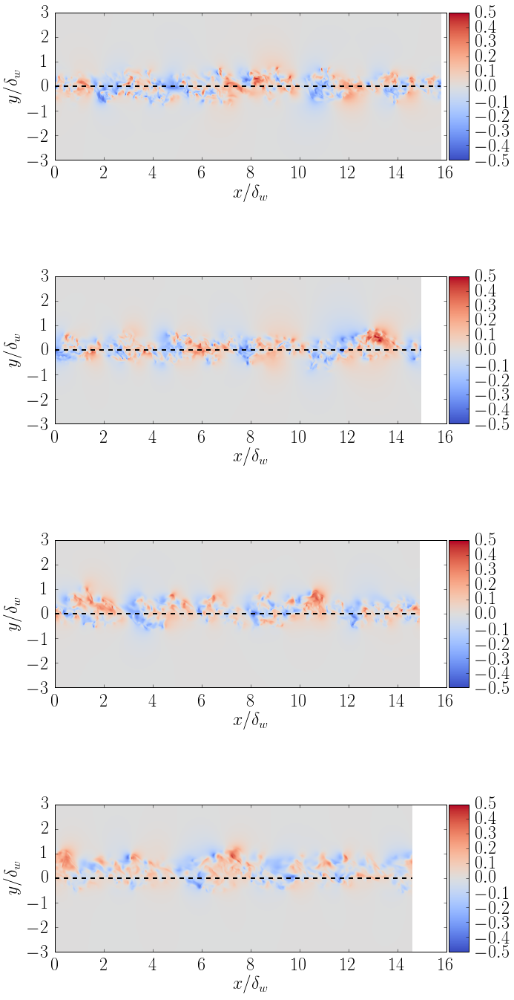

In [10]:
PRINT = True

pc = list(np.zeros(len(v_names)))
scase = [1,2,4,8]
vDT = [ 1.  ,    0.75 ,   1.875 ,  3.9375]
vTmin = [0.,   7.50000000e-01 ,  6.25000000e-01,   5.62500000e-01]
scaling = 'dw'
#xlen=10
#ylen=6
fig , axv = plt.subplots(len(v_names),1,figsize=(xlen,ylen*len(v_names)))
xlabel=r'$x/\delta_w$'
ylabel=r'$y/\delta_w$'
for i,name in zip(range(len(v_names)),v_names):
    z = data[name]['y']/data[name][scaling]
    x = data[name]['x']/data[name][scaling]
#fig, ax = plt.subplots()
    ff = np.array(data[name][var])
    nny, nnx = np.shape(ff)
    #ff = (ff-vTmin[i])/vDT[i]
    mean = np.mean(ff,axis=1)
    for jj in range(nny):
        ff[jj,:]=ff[jj,:]-mean[jj]
    print "min value =%s, max value = %s" %(np.nanmin(ff),np.nanmax(ff))
    #print "plane at %s" %(data[name]['y'])
    #cmap = plt.get_cmap('gist_heat'),hot
    #pc[i] = axv[i].imshow(ff,extent=(x.min(), x.max(), z.min(), z.max()),\
    #                      cmap=cm.coolwarm,origin='lower',vmin=0.0,vmax=0.4)
    #cmap=cm.gist_stern,origin='lower',vmin=0.0,vmax=0.4)
    pc[i] = axv[i].pcolormesh(x,z,ff,cmap=cm.coolwarm,shading='bicubic',vmin=-0.5,vmax=0.5)
    #cmap=cm.gist_stern,cm.RdBu
    
    axv[i].set_xlabel(xlabel);
    axv[i].set_ylabel(ylabel);
    stitle="%s for s=%s, time = %s, delta=%s" % (var,scase[i],data[name]['time'],\
                                                      data[name][scaling])
    print stitle
    #axv[i].set_xlim([0,10])

    #axv[i].set_title(stitle)
    axv[i].plot([x.min(),x.max()],[0.0, 0.0],color='black',lw=2.0,ls='dashed')
    axv[i].set_ylim([-3,3])
    axv[i].set_aspect('equal', 'box')

    divider = make_axes_locatable(axv[i])
    cax = divider.append_axes("right", size="5%", pad=0.05)
    c = plt.colorbar(pc[i],cax=cax) 
#cbar = fig.colorbar(cax, ticks=[-0.5, 0, 0.5])
                         
#fig.tight_layout()
figname = 'vp_yx_coolwarm'
#figname = 'up_yx_coolwarm'
if PRINT == True:
    pathname = save_folder + figname+ fformat
    print "Figure saved at = %s" %(pathname)
    fig.savefig(pathname,bbox_inches='tight')                    
                         

# Streamwise velocity

In [32]:
data={}#dictionary
firsttime = True
var = 'up'
figname = 'u_yx'
#vy0 = np.multiply([0.0,0.5,0.5,0.5],[49.16, 48.96,51.36,46])
#vy0 = np.multiply([0.3,0.5,0.5,0.5],[49.16, 48.96,51.36,46])
ik = 0
for p,name in zip(p_field,v_names):
    path  = p + '.'+var+'yx'
    #firsttime = True
    print path
    data[name] = {}
    #time,x,y,jspecy,vy,z,wk,Re = read1yxplane(path)
    #time,x,y,jspecy,vy,z,wk,Re = read1yzplane(path)
    time,x,y,z,wk,Re = readyxplane(path)
    
    #wk = wk.reshape((len(z),len(x)))
    #data[var] = wk.reshape((len(x),len(z)))
    data[name][var] = np.array(wk) 
    #if var != 'scal':
    #    data['d'+var+'dz'] = (wk[:,2,:]-wk[:,0,:])/(2*np.diff(z)[1])
    data[name]['time'] = time
    data[name]['x']  = x
    data[name]['y']  = y
    data[name]['z']  = z
    data[name]['Re'] = Re
    data[name]['dw'] = np.interp(time,hist[name]['time'],hist[name]['dw'])
    data[name]['dm'] = np.interp(time,hist[name]['time'],hist[name]['dm'])
    print "For field %s:\n time = %s, dw=%s, dm=%s"%(name,time,data[name]['dw'],data[name]['dm'])
    ik += 1
    #firsttime  = False
wk=0.0

/home/toni/fields/VDML_JFM/s10a_006.upyx
[ 0.0136295] [ 0.036319]
For field s10a:
 time = 399.842, dw=29.2303972998, dm=5.93922999025
/home/toni/fields/VDML_JFM/s20d_007.upyx
[ 0.0136295] [ 0.036319]
For field s20d:
 time = 418.846, dw=30.7833095235, dm=5.70466377491
/home/toni/fields/VDML_JFM/s40d_017.upyx
[ 0.0136295] [ 0.036319]
For field s40d:
 time = 455.564, dw=30.9288376628, dm=4.92549366359
/home/toni/fields/VDML_JFM/s80b_013.upyx
[ 0.0136295] [ 0.036319]
For field s80b:
 time = 569.637, dw=31.5409215549, dm=4.27063772539


min value =-0.713961541653, max value = 0.725896298885
up for s=1, time = 399.842, delta=29.2303972998
min value =-0.686094760895, max value = 0.805085062981
up for s=2, time = 418.846, delta=30.7833095235
min value =-0.671055436134, max value = 0.730892896652
up for s=4, time = 455.564, delta=30.9288376628
min value =-0.716574788094, max value = 0.681638002396
up for s=8, time = 569.637, delta=31.5409215549
Figure saved at = /share/drive/toni/VDML/JFM_SUBMISSION/fig14.tiff


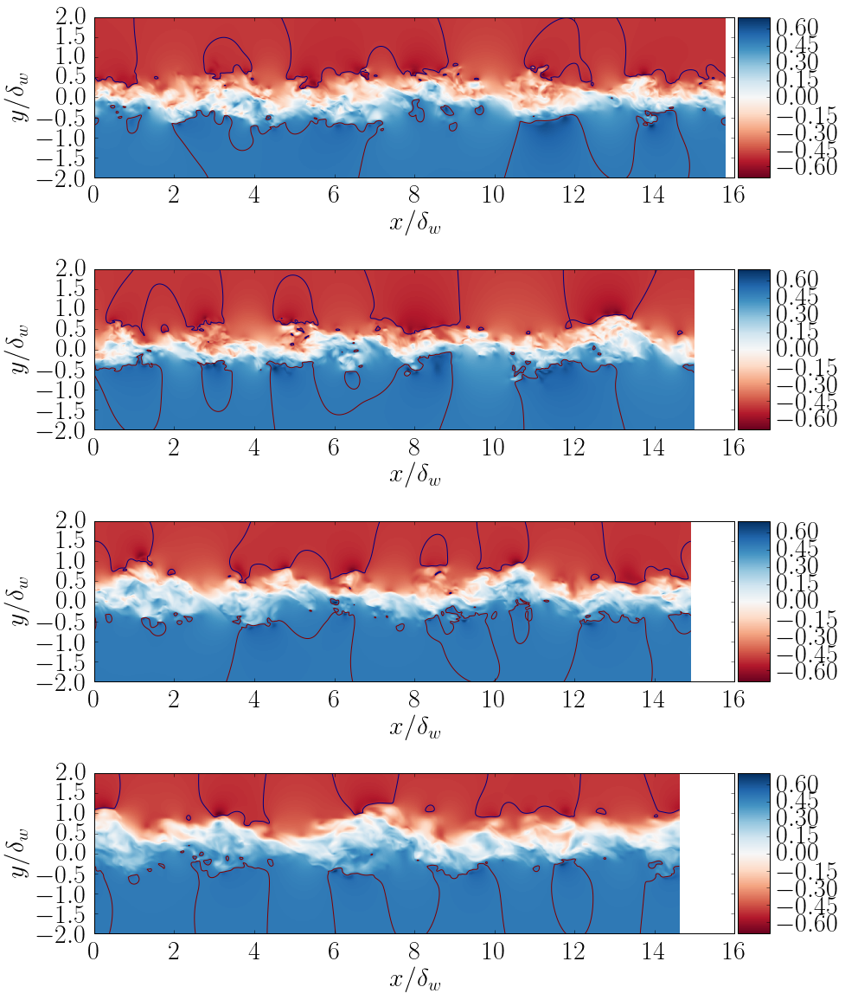

In [33]:
#from matplotlib.backends.backend_pdf import PdfPages
fformat ='.tiff'
pc = list(np.zeros(len(v_names)))
pc2 = list(np.zeros(len(v_names)))
scase = [1,2,4,8]
vDT = [ 1.  ,    0.75 ,   1.875 ,  3.9375]
vTmin = [0.,   7.50000000e-01 ,  6.25000000e-01,   5.62500000e-01]
scaling = 'dw'
xlen=14
ylen=5
fig , axv = plt.subplots(len(v_names),1,figsize=(xlen,1*ylen*len(v_names)))
xlabel=r'$x/\delta_w$'
ylabel=r'$y/\delta_w$'
for i,name in zip(range(len(v_names)),v_names):
    z = data[name]['y']/data[name][scaling]
    x = data[name]['x']/data[name][scaling]
#fig, ax = plt.subplots()
    ff = np.array(data[name][var])
    #nny, nnx = np.shape(ff)
    #ff = (ff-vTmin[i])/vDT[i]
    print "min value =%s, max value = %s" %(np.nanmin(ff),np.nanmax(ff))
    nxpoints,nzpoints = np.shape(ff)
    #mean = np.mean(ff,axis=1)
    #for jj in range(nny):
    #ff2[jj,:]=ff[jj,:]-mean[jj]
    #print "plane at %s" %(data[name]['y'])
    #cmap = plt.get_cmap('gist_heat'),hot
    #pc[i] = axv[i].imshow(ff,extent=(x.min(), x.max(), z.min(), z.max()),interpolation='bicubic',aspect=nzpoints/nxpoints,\
    #                      cmap=cm.coolwarm,origin='lower',vmin=-0.6,vmax=0.6)
    #pc[i] = axv[i].pcolormesh(x,z,ff,cmap=cm.coolwarm,shading='bicubic',vmin=-0.5,vmax=0.5)
    pc[i] = axv[i].pcolormesh(x,z,ff,cmap=cm.RdBu,shading='bicubic',vmin=-0.7,vmax=0.7)
    pc2[i] = axv[i].contour(x,z,ff,levels=[-0.5,0.5])
    #cm.RdBu
    axv[i].set_xlabel(xlabel);
    axv[i].set_ylabel(ylabel);
    stitle="%s for s=%s, time = %s, delta=%s" % (var,scase[i],data[name]['time'],\
                                                      data[name][scaling])
    print stitle
    #axv[i].set_xlim([0,10])
    #axv[i].set_aspect('equal', 'datalim')
    #axv[i].set_title(stitle)
    #axv[i].plot([x.min(),x.max()],[0.0, 0.0],color='white',lw=2.0)
    axv[i].set_ylim([-2,2])
    axv[i].set_xlim([0,16])
    axv[i].set_aspect('equal','box')
    

    divider = make_axes_locatable(axv[i])
    cax = divider.append_axes("right", size="5%", pad=0.05)
    c = plt.colorbar(pc[i],cax=cax) 
#cbar = fig.colorbar(cax, ticks=[-0.5, 0, 0.5])
                         
#fig.tight_layout()
figname='fig14'
PRINT = True
if PRINT == True:
    pathname = save_folder + figname+ fformat
    fig.savefig(pathname,bbox_inches='tight')
    print "Figure saved at = %s" %(pathname)
    #fig.savefig(pathname)                    
                         

min value =-0.532148361206, max value = 0.485407352448
vp for s=1, time = 399.842, delta=29.2303972998
min value =-0.498743027449, max value = 0.553047418594
vp for s=2, time = 418.846, delta=30.7833095235
min value =-0.424223989248, max value = 0.429772466421
vp for s=4, time = 455.564, delta=30.9288376628
min value =-0.380596160889, max value = 0.443687587976
vp for s=8, time = 569.637, delta=31.5409215549
Figure saved at = /share/drive/toni/VDML/JFM/fields/u_yx.png


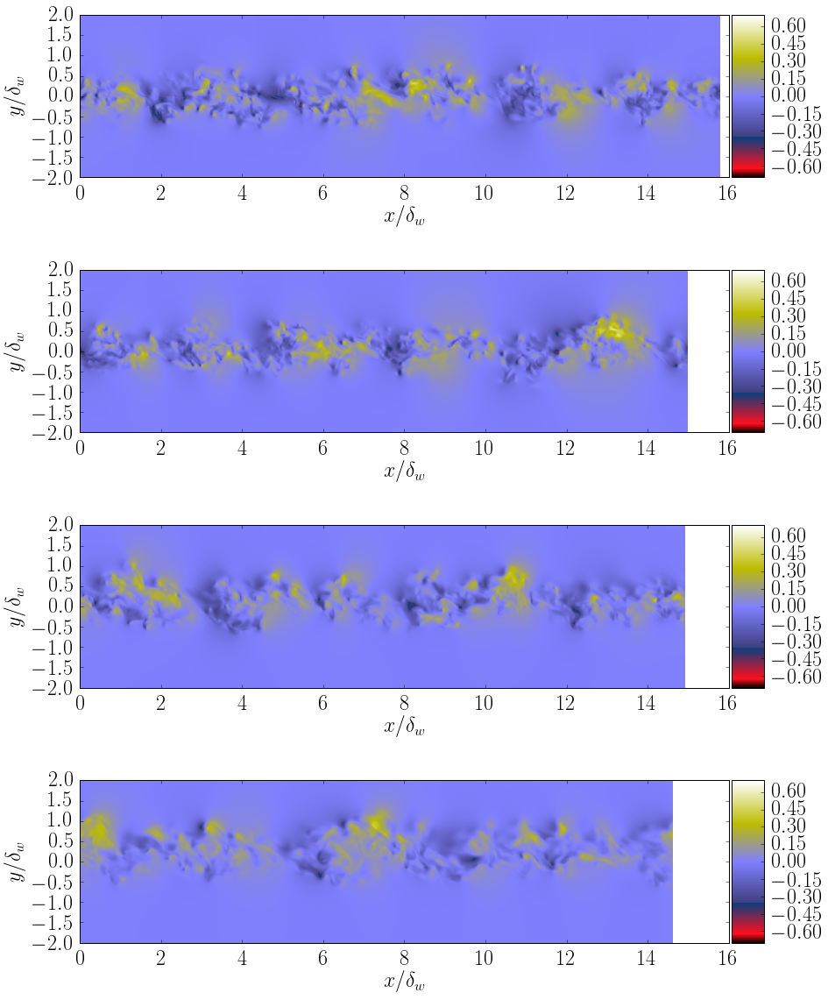

In [29]:
PRINT = True
pc = list(np.zeros(len(v_names)))
scase = [1,2,4,8]
vDT = [ 1.  ,    0.75 ,   1.875 ,  3.9375]
vTmin = [0.,   7.50000000e-01 ,  6.25000000e-01,   5.62500000e-01]
scaling = 'dw'
#xlen=10
#ylen=5
fig , axv = plt.subplots(len(v_names),1,figsize=(xlen,ylen*len(v_names)))
xlabel=r'$x/\delta_w$'
ylabel=r'$y/\delta_w$'
for i,name in zip(range(len(v_names)),v_names):
    z = data[name]['y']/data[name][scaling]
    x = data[name]['x']/data[name][scaling]
#fig, ax = plt.subplots()
    ff = np.array(data[name][var])
    #nny, nnx = np.shape(ff)
    #ff = (ff-vTmin[i])/vDT[i]
    print "min value =%s, max value = %s" %(np.nanmin(ff),np.nanmax(ff))
    #mean = np.mean(ff,axis=1)
    #for jj in range(nny):
    #ff2[jj,:]=ff[jj,:]-mean[jj]
    #print "plane at %s" %(data[name]['y'])
    #cmap = plt.get_cmap('gist_heat'),hot
    #pc[i] = axv[i].imshow(ff,extent=(x.min(), x.max(), z.min(), z.max()),interpolation='bicubic',\
                          #cmap=cm.gist_stern,origin='lower',vmin=-0.6,vmax=0.6,aspect=1)
    pc[i] = axv[i].pcolormesh(x,z,ff,cmap=cm.gist_stern,shading='bicubic',vmin=-0.7,vmax=0.7)
    
    axv[i].set_xlabel(xlabel);
    axv[i].set_ylabel(ylabel);
    stitle="%s for s=%s, time = %s, delta=%s" % (var,scase[i],data[name]['time'],\
                                                      data[name][scaling])
    print stitle
    #axv[i].plot([x.min(),x.max()],[0.0, 0.0],color='white',lw=2.0)
    #axv[i].set_xlim([0,10])
    axv[i].set_ylim([-2,2])
    axv[i].set_xlim([0,16])
    axv[i].set_aspect('equal', 'box')
    #axv[i].set_title(stitle)
   
    divider = make_axes_locatable(axv[i])
    cax = divider.append_axes("right", size="5%", pad=0.05)
    c = plt.colorbar(pc[i],cax=cax) 
#cbar = fig.colorbar(cax, ticks=[-0.5, 0, 0.5])
                         
#fig.tight_layout()

if PRINT == True:
    pathname = save_folder + figname+ fformat
    fig.savefig(pathname,bbox_inches='tight')  
    print "Figure saved at = %s" %(pathname)
                         

min value =-0.565886229383, max value = 0.663728801027
up for s=1, time = 399.842, delta=29.2303972998
min value =-0.547797180675, max value = 0.62335383406
up for s=2, time = 418.846, delta=30.7833095235
min value =-0.542752860387, max value = 0.675903316654
up for s=4, time = 455.564, delta=30.9288376628
min value =-0.449530881911, max value = 0.579203679392
up for s=8, time = 569.637, delta=31.5409215549
Figure saved at = /share/drive/toni/VDML/JFM/fields/up_yx_hot.png


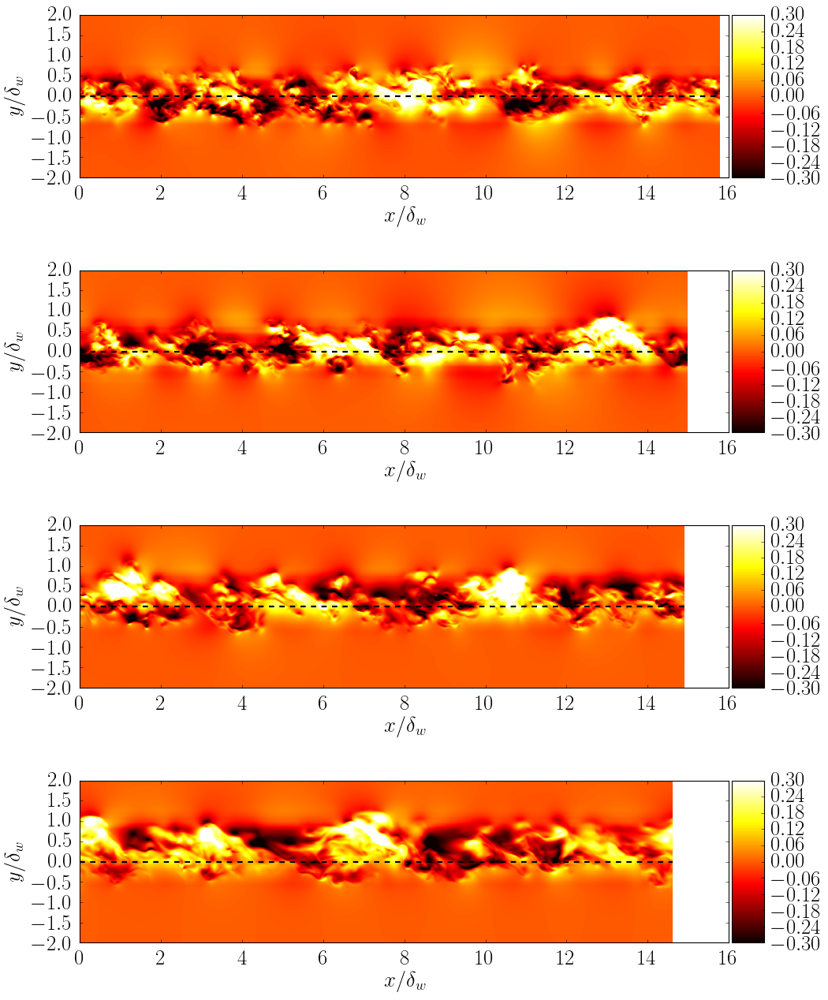

In [95]:
PRINT = True

pc = list(np.zeros(len(v_names)))
scase = [1,2,4,8]
vDT = [ 1.  ,    0.75 ,   1.875 ,  3.9375]
vTmin = [0.,   7.50000000e-01 ,  6.25000000e-01,   5.62500000e-01]
scaling = 'dw'
#xlen=10
#ylen=6
fig , axv = plt.subplots(len(v_names),1,figsize=(xlen,ylen*len(v_names)))
xlabel=r'$x/\delta_w$'
ylabel=r'$y/\delta_w$'
for i,name in zip(range(len(v_names)),v_names):
    z = data[name]['y']/data[name][scaling]
    x = data[name]['x']/data[name][scaling]
#fig, ax = plt.subplots()
    ff = np.array(data[name][var])
    nny, nnx = np.shape(ff)
    #ff = (ff-vTmin[i])/vDT[i]
    mean = np.mean(ff,axis=1)
    for jj in range(nny):
        ff[jj,:]=ff[jj,:]-mean[jj]
    print "min value =%s, max value = %s" %(np.nanmin(ff),np.nanmax(ff))
    #print "plane at %s" %(data[name]['y'])
    #cmap = plt.get_cmap('gist_heat'),hot
    #pc[i] = axv[i].imshow(ff,extent=(x.min(), x.max(), z.min(), z.max()),\
    #                      cmap=cm.coolwarm,origin='lower',vmin=0.0,vmax=0.4)
    #cmap=cm.gist_stern,origin='lower',vmin=0.0,vmax=0.4)
    pc[i] = axv[i].pcolormesh(x,z,ff,cmap=cm.hot,shading='bicubic',vmin=-0.3,vmax=0.3)
    #cmap=cm.gist_stern,RdBu
    
    axv[i].set_xlabel(xlabel);
    axv[i].set_ylabel(ylabel);
    stitle="%s for s=%s, time = %s, delta=%s" % (var,scase[i],data[name]['time'],\
                                                      data[name][scaling])
    print stitle
    #axv[i].set_xlim([0,10])

    #axv[i].set_title(stitle)
    axv[i].plot([x.min(),x.max()],[0.0, 0.0],color='black',lw=2.0,ls='dashed')
    axv[i].set_ylim([-2,2])
    axv[i].set_aspect('equal', 'box')

    divider = make_axes_locatable(axv[i])
    cax = divider.append_axes("right", size="5%", pad=0.05)
    c = plt.colorbar(pc[i],cax=cax) 
#cbar = fig.colorbar(cax, ticks=[-0.5, 0, 0.5])
                         
#fig.tight_layout()
figname = 'up_yx_hot'
#figname = 'up_yx_coolwarm'
if PRINT == True:
    pathname = save_folder + figname+ fformat
    print "Figure saved at = %s" %(pathname)
    fig.savefig(pathname,bbox_inches='tight')                    
                         

# Vorticity  

In [72]:
data={}#dictionary
firsttime = True
var = 'o2'
#vy0 = np.multiply([0.0,0.5,0.5,0.5],[49.16, 48.96,51.36,46])
#vy0 = np.multiply([0.3,0.5,0.5,0.5],[49.16, 48.96,51.36,46])
ik = 0
for p,name in zip(p_field,v_names):
    path  = p + '.'+var+'yx'
    #firsttime = True
    print path
    data[name] = {}
    #time,x,y,jspecy,vy,z,wk,Re = read1yxplane(path)
    #time,x,y,jspecy,vy,z,wk,Re = read1yzplane(path)
    time,x,y,z,wk,Re = readyxplane(path)
    
    #wk = wk.reshape((len(z),len(x)))
    #data[var] = wk.reshape((len(x),len(z)))
    data[name][var] = np.array(wk) 
    #if var != 'scal':
    #    data['d'+var+'dz'] = (wk[:,2,:]-wk[:,0,:])/(2*np.diff(z)[1])
    data[name]['time'] = time
    data[name]['x']  = x
    data[name]['y']  = y
    data[name]['z']  = z
    data[name]['Re'] = Re
    data[name]['dw'] = np.interp(time,hist[name]['time'],hist[name]['dw'])
    data[name]['dm'] = np.interp(time,hist[name]['time'],hist[name]['dm'])
    print "For field %s:\n time = %s, dw=%s, dm=%s"%(name,time,data[name]['dw'],data[name]['dm'])
    ik += 1
    #firsttime  = False
wk=0.0

/home/toni/fields/VDML_JFM/s10a_006.o2yx
[ 0.0136295] [ 0.036319]
For field s10a:
 time = 399.842, dw=29.2303972998, dm=5.93922999025
/home/toni/fields/VDML_JFM/s20d_007.o2yx
[ 0.0136295] [ 0.036319]
For field s20d:
 time = 418.846, dw=30.7833095235, dm=5.70466377491
/home/toni/fields/VDML_JFM/s40d_017.o2yx
[ 0.0136295] [ 0.036319]
For field s40d:
 time = 455.564, dw=30.9288376628, dm=4.92549366359
/home/toni/fields/VDML_JFM/s80b_013.o2yx
[ 0.0136295] [ 0.036319]
For field s80b:
 time = 569.637, dw=31.5409215549, dm=4.27063772539


min value =-0.845011234283, max value = 0.965011239052
o2 for s=1, time = 399.842, delta=29.2303972998
min value =-0.964577555656, max value = 1.04247426987
o2 for s=2, time = 418.846, delta=30.7833095235
min value =-0.498270332813, max value = 0.60465323925
o2 for s=4, time = 455.564, delta=30.9288376628
min value =-0.414540529251, max value = 0.321797013283
o2 for s=8, time = 569.637, delta=31.5409215549
Figure saved at = /share/drive/toni/VDML/JFM/fields/o2_yx.png


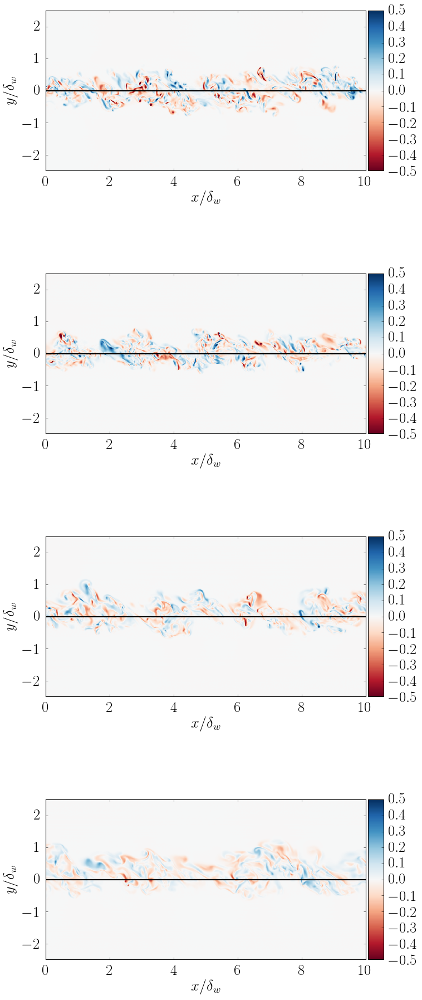

In [74]:
PRINT = True

pc = list(np.zeros(len(v_names)))
scase = [1,2,4,8]
vDT = [ 1.  ,    0.75 ,   1.875 ,  3.9375]
vTmin = [0.,   7.50000000e-01 ,  6.25000000e-01,   5.62500000e-01]
scaling = 'dw'
xlen=10
ylen=6
fig , axv = plt.subplots(len(v_names),1,figsize=(xlen,ylen*len(v_names)))
xlabel=r'$x/\delta_w$'
ylabel=r'$y/\delta_w$'
for i,name in zip(range(len(v_names)),v_names):
    z = data[name]['y']/data[name][scaling]
    x = data[name]['x']/data[name][scaling]
#fig, ax = plt.subplots()
    ff = np.array(data[name][var])
    #nny, nnx = np.shape(ff)
    #ff = (ff-vTmin[i])/vDT[i]
    print "min value =%s, max value = %s" %(np.nanmin(ff),np.nanmax(ff))
    #mean = np.mean(ff,axis=1)
    #for jj in range(nny):
    #ff2[jj,:]=ff[jj,:]-mean[jj]
    #print "plane at %s" %(data[name]['y'])
    #cmap = plt.get_cmap('gist_heat'),hot
    #pc[i] = axv[i].imshow(ff,extent=(x.min(), x.max(), z.min(), z.max()),interpolation='bicubic',\
    #                      cmap=cm.seismic,origin='lower',vmin=-1.0,vmax=1.0)
    pc[i] = axv[i].pcolormesh(x,z,ff,cmap=cm.RdBu,shading='bicubic',vmin=-0.5,vmax=0.5)
    
    
    axv[i].set_xlabel(xlabel);
    axv[i].set_ylabel(ylabel);
    stitle="%s for s=%s, time = %s, delta=%s" % (var,scase[i],data[name]['time'],\
                                                      data[name][scaling])
    print stitle
    axv[i].set_xlim([0,10])
    axv[i].set_ylim([-2.5,2.5])
    axv[i].set_aspect('equal', 'datalim')
    #axv[i].set_title(stitle)
    axv[i].plot([x.min(),x.max()],[0.0, 0.0],color='black',lw=2.0)

    divider = make_axes_locatable(axv[i])
    cax = divider.append_axes("right", size="5%", pad=0.05)
    c = plt.colorbar(pc[i],cax=cax) 
#cbar = fig.colorbar(cax, ticks=[-0.5, 0, 0.5])
                         
fig.tight_layout()
figname = 'o2_yx'
if PRINT == True:
    pathname = save_folder + figname+ fformat
    print "Figure saved at = %s" %(pathname)
    fig.savefig(pathname,bbox_inches='tight')                    
                         

# Enstrophy 

In [156]:
data={}#dictionary
firsttime = True

# Enstrophy
#vy0 = np.multiply([0.0,0.5,0.5,0.5],[49.16, 48.96,51.36,46])
#vy0 = np.multiply([0.3,0.5,0.5,0.5],[49.16, 48.96,51.36,46])
ik = 0
for p,name in zip(p_field,v_names):
    data[name] = {}
    var = 'o1'
    path  = p + '.'+var+'yx'
    time,x,y,z,wk,Re = readyxplane(path)
    data[name][var] = np.array(wk) 
    
    var = 'o2'
    path  = p + '.'+var+'yx'
    time,x,y,z,wk,Re = readyxplane(path)
    data[name][var] = np.array(wk) 
    
    var = 'o3'
    path  = p + '.'+var+'yx'
    time,x,y,z,wk,Re = readyxplane(path)
    data[name][var] = np.array(wk) 
    data[name]['ens']=0.5*(data[name]['o1']**2+data[name]['o2']**2+data[name]['o3']**2)
    
    #if var != 'scal':
    #    data['d'+var+'dz'] = (wk[:,2,:]-wk[:,0,:])/(2*np.diff(z)[1])
    data[name]['time'] = time
    data[name]['x']  = x
    data[name]['y']  = y
    data[name]['z']  = z
    data[name]['Re'] = Re
    data[name]['dw'] = np.interp(time,hist[name]['time'],hist[name]['dw'])
    data[name]['dm'] = np.interp(time,hist[name]['time'],hist[name]['dm'])
    print "For field %s:\n time = %s, dw=%s, dm=%s"%(name,time,data[name]['dw'],data[name]['dm'])
    ik += 1
    #firsttime  = False
wk=0.0
var = 'ens'

[ 0.0136295] [ 0.036319]
[ 0.0136295] [ 0.036319]
[ 0.0136295] [ 0.036319]
For field s10a:
 time = 399.842, dw=29.2303972998, dm=5.93922999025
[ 0.0136295] [ 0.036319]
[ 0.0136295] [ 0.036319]
[ 0.0136295] [ 0.036319]
For field s20d:
 time = 418.846, dw=30.7833095235, dm=5.70466377491
[ 0.0136295] [ 0.036319]
[ 0.0136295] [ 0.036319]
[ 0.0136295] [ 0.036319]
For field s40d:
 time = 455.564, dw=30.9288376628, dm=4.92549366359
[ 0.0136295] [ 0.036319]
[ 0.0136295] [ 0.036319]
[ 0.0136295] [ 0.036319]
For field s80b:
 time = 569.637, dw=31.5409215549, dm=4.27063772539


min value =8.47649127164e-19, max value = 0.913853432165
ens for s=1, time = 399.842, delta=29.2303972998
min value =3.70915400634e-19, max value = 1.63506130556
ens for s=2, time = 418.846, delta=30.7833095235
min value =1.13694816845e-19, max value = 0.590759502979
ens for s=4, time = 455.564, delta=30.9288376628
min value =2.07684117124e-19, max value = 0.190868858725
ens for s=8, time = 569.637, delta=31.5409215549
Figure saved at = /share/drive/toni/VDML/JFM/fields/ens_2std_yx.eps


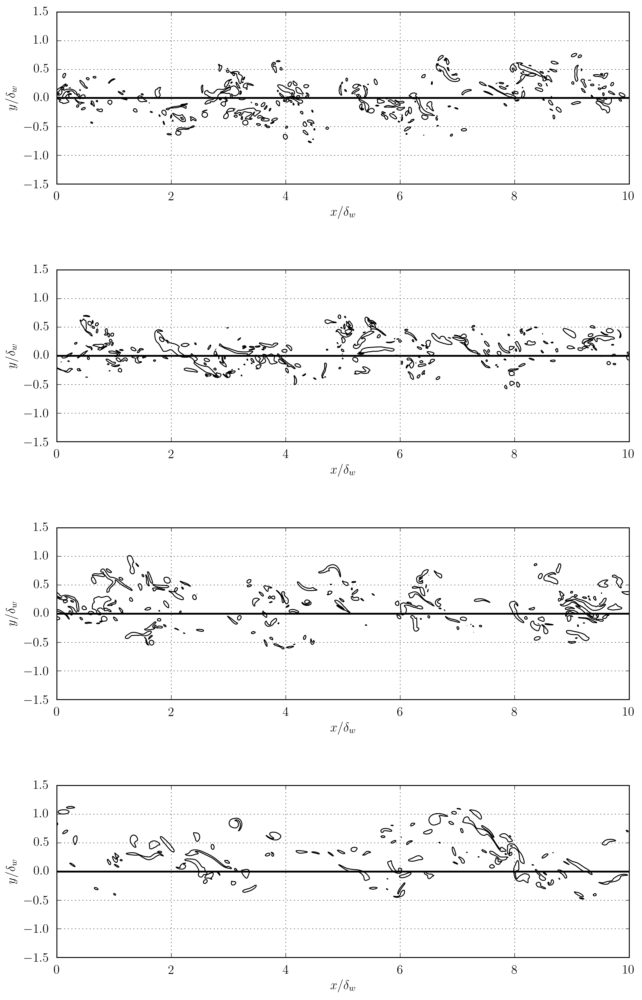

In [157]:
PRINT = True
"""
u = o1.^2+o2.^2+o3.^2;
uref = std(u(:)); %third dimension is y
uref = uref*(1+ ref) %ref = 2 means mean + 2 sigma
u = single(u);
"""
ref = 2.0

pc = list(np.zeros(len(v_names)))
scase = [1,2,4,8]
vDT = [ 1.  ,    0.75 ,   1.875 ,  3.9375]
vTmin = [0.,   7.50000000e-01 ,  6.25000000e-01,   5.62500000e-01]
scaling = 'dw'
xlen=10
ylen=4
fig , axv = plt.subplots(len(v_names),1,figsize=(xlen,ylen*len(v_names)))
xlabel=r'$x/\delta_w$'
ylabel=r'$y/\delta_w$'
NC = 1
cmap = plt.get_cmap('RdBu')
for i,name in zip(range(len(v_names)),v_names):
    z = data[name]['y']/data[name][scaling]
    x = data[name]['x']/data[name][scaling]
#fig, ax = plt.subplots()
    ff = np.array(data[name][var])
    #nny, nnx = np.shape(ff)
    #ff = (ff-vTmin[i])/vDT[i]
    print "min value =%s, max value = %s" %(np.nanmin(ff),np.nanmax(ff))
    #mean = np.mean(ff,axis=1)
    #for jj in range(nny):
    #ff2[jj,:]=ff[jj,:]-mean[jj]
    oref = np.std(ff)*(1+ref)
    #pc[i] = axv[i].imshow(ff,extent=(x.min(), x.max(), z.min(), z.max()),interpolation='bicubic',\
    #                      cmap=cm.gist_stern,origin='lower',vmin=ff.min(),vmax=ff.max())
    levels = MaxNLocator(nbins=NC).tick_values(np.nanmin(ff), oref)
    pc[i] = axv[i].contour(x,z,ff,levels,colors='black',lw=2.0)
    axv[i].set_xlabel(xlabel);
    axv[i].set_ylabel(ylabel);
    stitle="%s for s=%s, time = %s, delta=%s" % (var,scase[i],data[name]['time'],\
                                                      data[name][scaling])
    print stitle
    #axv[i].set_xlim([0,10])
    #axv[i].set_ylim([-2,2])
    axv[i].set_aspect('equal')
    axv[i].set_xlim([0,10])
    axv[i].set_ylim([-1.5,1.5])
    #axv[i].set_title(stitle)
    axv[i].plot([x.min(),x.max()],[0.0, 0.0],color='black',lw=2.0)
    axv[i].grid('on')
    #divider = make_axes_locatable(axv[i])
    #cax = divider.append_axes("right", size="5%", pad=0.05)
    #c = plt.colorbar(pc[i],cax=cax) 
#cbar = fig.colorbar(cax, ticks=[-0.5, 0, 0.5])

fig.tight_layout()
figname = 'ens_2std_yx'
if PRINT == True:
    pathname = save_folder + figname+ fformat
    print "Figure saved at = %s" %(pathname)
    fig.savefig(pathname,bbox_inches='tight')                    
                         

# Temperature

In [30]:
data={}#dictionary
firsttime = True
var = 'Tf'
#vy0 = np.multiply([0.0,0.5,0.5,0.5],[49.16, 48.96,51.36,46])
#vy0 = np.multiply([0.3,0.5,0.5,0.5],[49.16, 48.96,51.36,46])
ik = 0
for p,name in zip(p_field,v_names):
    path  = p + '.'+var+'yx'
    #firsttime = True
    print path
    data[name] = {}
    #time,x,y,jspecy,vy,z,wk,Re = read1yxplane(path)
    #time,x,y,jspecy,vy,z,wk,Re = read1yzplane(path)
    time,x,y,z,wk,Re = readyxplane(path)
    
    
    #wk = wk.reshape((len(z),len(x)))
    #data[var] = wk.reshape((len(x),len(z)))
    data[name][var] = np.array(wk) 
    #if var != 'scal':
    #    data['d'+var+'dz'] = (wk[:,2,:]-wk[:,0,:])/(2*np.diff(z)[1])
    data[name]['time'] = time
    data[name]['x']  = x
    data[name]['y']  = y
    data[name]['z']  = z
    data[name]['Re'] = Re
    data[name]['dw'] = np.interp(time,hist[name]['time'],hist[name]['dw'])
    data[name]['dm'] = np.interp(time,hist[name]['time'],hist[name]['dm'])
    print "For field %s:\n time = %s, dw=%s, dm=%s"%(name,time,data[name]['dw'],data[name]['dm'])
    ik += 1
    #firsttime  = False
wk=0.0

/home/toni/fields/VDML_JFM/s10a_006.Tfyx
[ 0.0136295] [ 0.036319]
For field s10a:
 time = 399.842, dw=29.2303972998, dm=5.93922999025
/home/toni/fields/VDML_JFM/s20d_007.Tfyx
[ 0.0136295] [ 0.036319]
For field s20d:
 time = 418.846, dw=30.7833095235, dm=5.70466377491
/home/toni/fields/VDML_JFM/s40d_017.Tfyx
[ 0.0136295] [ 0.036319]
For field s40d:
 time = 455.564, dw=30.9288376628, dm=4.92549366359
/home/toni/fields/VDML_JFM/s80b_013.Tfyx
[ 0.0136295] [ 0.036319]
For field s80b:
 time = 569.637, dw=31.5409215549, dm=4.27063772539


min value =-0.00217763334513, max value = 1.00480890274
Tf for s=1, time = 399.842, delta=29.2303972998
min value =-0.00328588485718, max value = 1.00124979019
Tf for s=2, time = 418.846, delta=30.7833095235
min value =-0.00100781122843, max value = 1.00133705139
Tf for s=4, time = 455.564, delta=30.9288376628
min value =-8.79802401104e-05, max value = 1.00001755972
Tf for s=8, time = 569.637, delta=31.5409215549
Figure saved at = /share/drive/toni/VDML/JFM_SUBMISSION/fig12.tiff


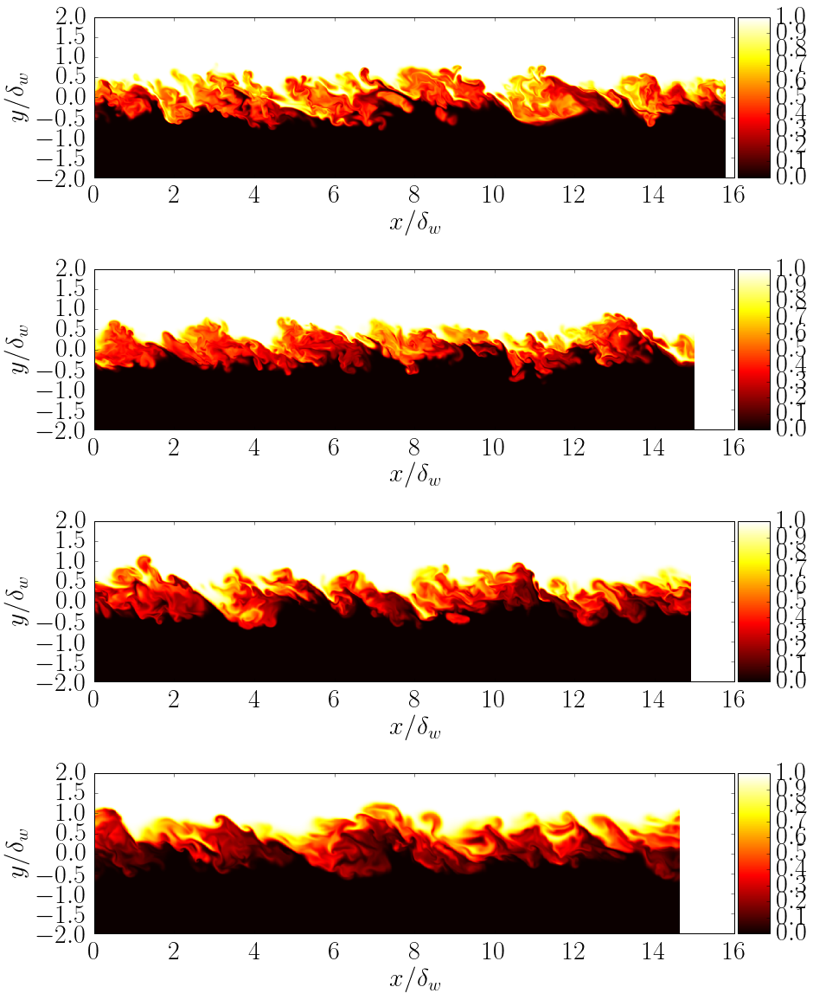

In [31]:
PRINT = True

pc = list(np.zeros(len(v_names)))
scase = [1,2,4,8]
vDT = [ 1.  ,    0.75 ,   1.875 ,  3.9375]
vTmin = [0.,   7.50000000e-01 ,  6.25000000e-01,   5.62500000e-01]
scaling = 'dw'
xlen=14
ylen=5
fig , axv = plt.subplots(len(v_names),1,figsize=(xlen,ylen*len(v_names)))
xlabel=r'$x/\delta_w$'
ylabel=r'$y/\delta_w$'
for i,name in zip(range(len(v_names)),v_names):
    z = data[name]['y']/data[name][scaling]
    x = data[name]['x']/data[name][scaling]
#fig, ax = plt.subplots()
    ff = np.array(data[name][var])
    nny, nnx = np.shape(ff)
    ff = (ff-vTmin[i])/vDT[i]
    print "min value =%s, max value = %s" %(np.nanmin(ff),np.nanmax(ff))
    #mean = np.mean(ff,axis=1)
    #for jj in range(nny):
    #ff2[jj,:]=ff[jj,:]-mean[jj]
    #print "plane at %s" %(data[name]['y'])
    #cmap = plt.get_cmap('gist_heat'),hot
    #pc[i] = axv[i].imshow(ff,extent=(x.min(), x.max(), z.min(), z.max()),interpolation='bicubic',\
    #                      cmap=cm.hot,origin='lower',vmin=0,vmax=1.0)
    pc[i] = axv[i].pcolormesh(x,z,ff,cmap=cm.hot,shading='bicubic',vmin=0,vmax=1)
    
    
    axv[i].set_xlabel(xlabel);
    axv[i].set_ylabel(ylabel);
    stitle="%s for s=%s, time = %s, delta=%s" % (var,scase[i],data[name]['time'],\
                                                      data[name][scaling])
    print stitle
    
    #axv[i].set_xlim([0,10])
    #axv[i].set_ylim([-5,5])
    axv[i].set_ylim([-2,2])
    axv[i].set_aspect('equal', 'box')

    divider = make_axes_locatable(axv[i])
    cax = divider.append_axes("right", size="5%", pad=0.05)
    c = plt.colorbar(pc[i],cax=cax) 
    #axv[i].plot([x.min(),x.max()],[0.0, 0.0],color='blue',lw=2.0,ls='dashed')
#cbar = fig.colorbar(cax, ticks=[-0.5, 0, 0.5])                        
#fig.tight_layout()
figname = 'theta_yx';figname='fig12'
if PRINT == True:
    pathname = save_folder + figname+ fformat
    print "Figure saved at = %s" %(pathname)
    fig.savefig(pathname,bbox_inches='tight')                    
                         

# Plxz

## Enstrophy

In [171]:
data={}#dictionary
firsttime = True
vy0 = np.multiply([0.0,0.5,0.5,0.5],[49.16, 48.96,51.36,46])
vy0 = np.multiply([0.3,0.5,0.5,0.5],[49.16, 48.96,51.36,46])
ik = 0
for p,name in zip(p_field,v_names):    
    data[name] = {}
    var = 'o1'
    path  = p + '.'+var+'xz'
    time,x,y,jspecy,vy,z,wk,Re = read1yxplane(path,vy0[ik])
    data[name][var] = np.array(wk) 
    
    var = 'o2'
    path  = p + '.'+var+'xz'
    time,x,y,jspecy,vy,z,wk,Re = read1yxplane(path,vy0[ik])
    data[name][var] = np.array(wk) 
    
    var = 'o3'
    path  = p + '.'+var+'xz'
    time,x,y,jspecy,vy,z,wk,Re = read1yxplane(path,vy0[ik])
    data[name][var] = np.array(wk) 
    data[name]['ens']=0.5*(data[name]['o1']**2+data[name]['o2']**2+data[name]['o3']**2)
    
    #wk = wk.reshape((len(z),len(x)))
    #data[var] = wk.reshape((len(x),len(z)))
    data[name][var] = np.array(wk) 
    #if var != 'scal':
    #    data['d'+var+'dz'] = (wk[:,2,:]-wk[:,0,:])/(2*np.diff(z)[1])
    data[name]['time'] = time
    data[name]['x']  = x
    data[name]['y']  = vy
    data[name]['z']  = z
    data[name]['Re'] = Re
    data[name]['dw'] = np.interp(time,hist[name]['time'],hist[name]['dw'])
    data[name]['dm'] = np.interp(time,hist[name]['time'],hist[name]['dm'])
    print "For field %s:\n time = %s, dw=%s, dm=%s"%(name,time,data[name]['dw'],data[name]['dm'])
    ik += 1
    #firsttime  = False
wk=0.0

[ 0.0136295] [ 0.036319]
[ 0.0136295] [ 0.036319]
[ 0.0136295] [ 0.036319]
For field s10a:
 time = 399.842, dw=29.2303972998, dm=5.93922999025
[ 0.0136295] [ 0.036319]
[ 0.0136295] [ 0.036319]
[ 0.0136295] [ 0.036319]
For field s20d:
 time = 418.846, dw=30.7833095235, dm=5.70466377491
[ 0.0136295] [ 0.036319]
[ 0.0136295] [ 0.036319]
[ 0.0136295] [ 0.036319]
For field s40d:
 time = 455.564, dw=30.9288376628, dm=4.92549366359
[ 0.0136295] [ 0.036319]
[ 0.0136295] [ 0.036319]
[ 0.0136295] [ 0.036319]
For field s80b:
 time = 569.637, dw=31.5409215549, dm=4.27063772539


min value =4.96758981047e-18, max value = 1.75004054151
ens at y=[-58.93439946 -58.47270439 -58.01401309 -57.55832557 -57.10564181
 -56.65596183 -56.20928561 -55.76561317 -55.3249445  -54.8872796
 -54.45261848 -54.02096112 -53.59230753 -53.16665772 -52.74401168
 -52.32436941 -51.90773091 -51.49409618 -51.08346523 -50.67583804
 -50.27121463 -49.86959499 -49.47097912 -49.07536702 -48.68275869
 -48.29315414 -47.90655335 -47.52294827 -47.14231474 -46.76462071
 -46.38983432 -46.01792391 -45.64885801 -45.28260534 -44.91913483
 -44.5584156  -44.20041695 -43.84510838 -43.49245958 -43.14244046
 -42.79502107 -42.4501717  -42.10786282 -41.76806506 -41.43074928
 -41.09588652 -40.76344799 -40.43340512 -40.10572951 -39.78039295
 -39.45736743 -39.13662512 -38.81813838 -38.50187975 -38.18782197
 -37.87593796 -37.56620083 -37.25858387 -36.95306057 -36.64960459
 -36.34818978 -36.04879018 -35.75138001 -35.45593367 -35.16242576
 -34.87083105 -34.58112449 -34.29328122 -34.00727657 -33.72308604
 -33.4406853

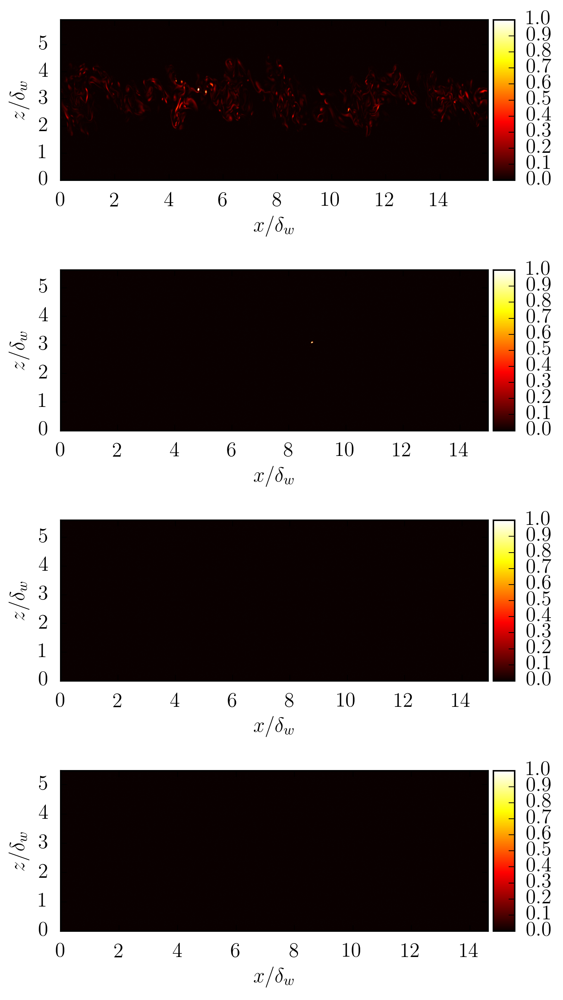

In [172]:
var = 'ens'
PRINT = True
pc = list(np.zeros(len(v_names)))
scase = [1,2,4,8]
vDT = [ 1.  ,    0.75 ,   1.875 ,  3.9375]
vTmin = [0.,   7.50000000e-01 ,  6.25000000e-01,   5.62500000e-01]
scaling = 'dw'
fig , axv = plt.subplots(len(v_names),1,figsize=(xlen,0.4*ylen*len(v_names)))
xlabel=r'$x/\delta_w$'
ylabel=r'$z/\delta_w$'
for i,name in zip(range(len(v_names)),v_names):
    z = data[name]['z']/data[name][scaling]
    x = data[name]['x']/data[name][scaling]
#fig, ax = plt.subplots()
    ff = np.array(data[name][var])
    nny, nnx = np.shape(ff)
    ff = (ff-vTmin[i])/vDT[i]
    print "min value =%s, max value = %s" %(np.nanmin(ff),np.nanmax(ff))
    #mean = np.mean(ff,axis=1)
    #for jj in range(nny):
    #ff2[jj,:]=ff[jj,:]-mean[jj]
    #print "plane at %s" %(data[name]['y'])
    #coolwarm
    pc[i] = axv[i].imshow(ff,extent=(x.min(), x.max(), z.min(), z.max()),interpolation='bicubic',\
                          cmap=cm.hot,origin='lower',vmin=-1,vmax=1.0)
    axv[i].set_aspect('equal', 'datalim')
    axv[i].set_xlabel(xlabel);
    axv[i].set_ylabel(ylabel);
    #axv[i].set_xlim([0,10])
    #axv[i].set_ylim([0,3.5])
    axv[i].set_aspect('equal', 'datalim')
    stitle="%s at y=%s for s=%s, time = %s, delta=%s" % (var,data[name]['y'],scase[i],data[name]['time'],\
                                                        data[name][scaling])
    print stitle
    #axv[i].set_title(stitle)

    divider = make_axes_locatable(axv[i])
    cax = divider.append_axes("right", size="5%", pad=0.05)
    c = plt.colorbar(pc[i],cax=cax) 
#cbar = fig.colorbar(cax, ticks=[-0.5, 0, 0.5])
                         
fig.tight_layout()
figname = 'ens_xz_ypeakHOT'
if PRINT == True:
    pathname = save_folder + figname+ fformat
    print "Figure saved at = %s" %(pathname)
    fig.savefig(pathname,bbox_inches='tight')                    
                         

## Velocity

In [27]:
data={}#dictionary
firsttime = True
var = 'up'
vy0 = np.multiply([0.0,0.5,0.5,0.5],[49.16, 48.96,51.36,46])
vy0 = np.multiply([0.0,0.3,0.5,0.7],[29.2, 30.8,30.9,31.5])
vy0 = np.multiply([0.0,0.0,0.0,0.0],[29.2, 30.8,30.9,31.5])
ik = 0
for p,name in zip(p_field,v_names):
    path  = p + '.'+var+'xz'
    #firsttime = True
    print path
    data[name] = {}
    #time,x,y,jspecy,vy,z,wk,Re = read1yxplane(path)
    #time,x,y,jspecy,vy,z,wk,Re = read1yzplane(path)
    #time,x,y,jspecy,vy,z,wk,Re = readxzfield(path,vy0[ik])
    time,x,y,jspecy,vy,z,wk,Re = readxzfield(path)
    #readxzfield
    
    #wk = wk.reshape((len(z),len(x)))
    #data[var] = wk.reshape((len(x),len(z)))
    data[name][var] = np.array(wk[:,:,0]) 
    #if var != 'scal':
    #    data['d'+var+'dz'] = (wk[:,2,:]-wk[:,0,:])/(2*np.diff(z)[1])
    data[name]['time'] = time
    data[name]['x']  = x
    data[name]['y']  = vy
    data[name]['z']  = z
    data[name]['Re'] = Re
    data[name]['dw'] = np.interp(time,hist[name]['time'],hist[name]['dw'])
    data[name]['dm'] = np.interp(time,hist[name]['time'],hist[name]['dm'])
    print "For field %s:\n time = %s, dw=%s, dm=%s"%(name,time,data[name]['dw'],data[name]['dm'])
    ik += 1
    #firsttime  = False
wk=0.0

/home/toni/fields/VDML_JFM/s10a_006.upxz
my=[851]
For field s10a:
 time = 399.842, dw=29.2303972998, dm=5.93922999025
/home/toni/fields/VDML_JFM/s20d_007.upxz
my=[851]
For field s20d:
 time = 418.846, dw=30.7833095235, dm=5.70466377491
/home/toni/fields/VDML_JFM/s40d_017.upxz
my=[851]
For field s40d:
 time = 455.564, dw=30.9288376628, dm=4.92549366359
/home/toni/fields/VDML_JFM/s80b_013.upxz
my=[851]
For field s80b:
 time = 569.637, dw=31.5409215549, dm=4.27063772539


min value =-0.677923858166, max value = 0.984211564064
-0.000680618009484
up at y=[ 0.] for s=1, time = 399.842, delta=29.2303972998
min value =-0.685101032257, max value = 0.807991266251
0.113381402524
up at y=[ 0.] for s=2, time = 418.846, delta=30.7833095235
min value =-0.453380584717, max value = 0.843622982502
0.217821818628
up at y=[ 0.] for s=4, time = 455.564, delta=30.9288376628
min value =-0.28435999155, max value = 0.686771869659
0.302669701073
up at y=[ 0.] for s=8, time = 569.637, delta=31.5409215549
Figure saved at = /share/drive/toni/VDML/JFM_SUBMISSION/fig15.tiff


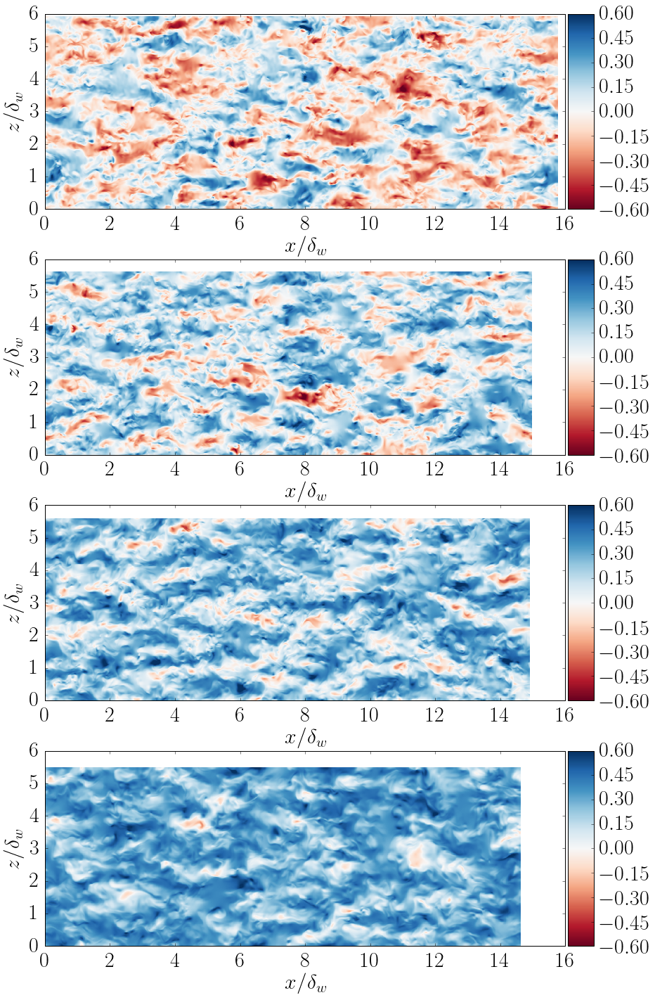

In [28]:
PRINT = True
pc = list(np.zeros(len(v_names)))
scase = [1,2,4,8]
vDT = [ 1.  ,    0.75 ,   1.875 ,  3.9375]
vTmin = [0.,   7.50000000e-01 ,  6.25000000e-01,   5.62500000e-01]
scaling = 'dw'
xlen = 14
ylen=6
fig , axv = plt.subplots(len(v_names),1,figsize=(xlen,ylen*len(v_names)))
xlabel=r'$x/\delta_w$'
ylabel=r'$z/\delta_w$'
for i,name in zip(range(len(v_names)),v_names):
    z = data[name]['z']/data[name][scaling]
    x = data[name]['x']/data[name][scaling]
#fig, ax = plt.subplots()
    ff = np.array(data[name][var])
    nny, nnx = np.shape(ff)
    #ff = (ff-vTmin[i])/vDT[i]
    print "min value =%s, max value = %s" %(np.nanmin(ff),np.nanmax(ff))
    mean = np.mean(ff[:])
    #ff = ff - mean
    print mean
    
    #for jj in range(nny):
    #    ff[jj,:]=ff[jj,:]-mean[jj]
    #print "plane at %s" %(data[name]['y'])
    #coolwarm,hot
    #pc[i] = axv[i].imshow(ff,extent=(x.min(), x.max(), z.min(), z.max()),interpolation='bicubic',\
    #                      cmap=cm.hot,origin='lower',vmin=-0.5,vmax=0.5)

    #pc[i] = axv[i].pcolormesh(x,z,ff,cmap=cm.hot,shading='bicubic',vmin=np.min(ff),vmax=np.max(ff))
    pc[i] = axv[i].pcolormesh(x,z,ff,cmap=cm.RdBu,shading='bicubic',vmin=-0.6,vmax=0.6)
    axv[i].set_aspect('equal', 'datalim')
    axv[i].set_xlabel(xlabel);
    axv[i].set_ylabel(ylabel);
    axv[i].set_xlim([0,16])
    #axv[i].set_ylim([0,3.5])
    axv[i].set_aspect('equal', 'box')
    stitle="%s at y=%s for s=%s, time = %s, delta=%s" % (var,data[name]['y'],scase[i],data[name]['time'],\
                                                        data[name][scaling])
    print stitle
    #axv[i].set_title(stitle)

    divider = make_axes_locatable(axv[i])
    cax = divider.append_axes("right", size="5%", pad=0.05)
    c = plt.colorbar(pc[i],cax=cax) 
#cbar = fig.colorbar(cax, ticks=[-0.5, 0, 0.5])
                         
#fig.tight_layout()
figname = 'u_xz_y0';figname='fig15'
if PRINT == True:
    pathname = save_folder + figname+ fformat
    print "Figure saved at = %s" %(pathname)
    fig.savefig(pathname,bbox_inches='tight')                    
                         

## Temperature

In [23]:
data={}#dictionary
firsttime = True
var = 'Tf'
vy0 = np.multiply([0.0,0.5,0.5,0.5],[49.16, 48.96,51.36,46])
vy0 = np.multiply([0.0,0.3,0.5,0.7],[29.2, 30.8,30.9,31.5])
ik = 0
for p,name in zip(p_field,v_names):
    path  = p + '.'+var+'xz'
    #firsttime = True
    print path
    data[name] = {}
    #time,x,y,jspecy,vy,z,wk,Re = read1yxplane(path)
    #time,x,y,jspecy,vy,z,wk,Re = read1yzplane(path)
    time,x,y,jspecy,vy,z,wk,Re = read1xzplane(path,vy0[ik])
    
    #wk = wk.reshape((len(z),len(x)))
    #data[var] = wk.reshape((len(x),len(z)))
    data[name][var] = np.array(wk) 
    #if var != 'scal':
    #    data['d'+var+'dz'] = (wk[:,2,:]-wk[:,0,:])/(2*np.diff(z)[1])
    data[name]['time'] = time
    data[name]['x']  = x
    data[name]['y']  = vy
    data[name]['z']  = z
    data[name]['Re'] = Re
    data[name]['dw'] = np.interp(time,hist[name]['time'],hist[name]['dw'])
    data[name]['dm'] = np.interp(time,hist[name]['time'],hist[name]['dm'])
    print "For field %s:\n time = %s, dw=%s, dm=%s"%(name,time,data[name]['dw'],data[name]['dm'])
    ik += 1
    #firsttime  = False
wk=0.0

/home/toni/fields/VDML_JFM/s10a_006.Tfxz
[ 0.0136295] [ 0.036319]


TypeError: only integer scalar arrays can be converted to a scalar index

In [ ]:
PRINT = True
pc = list(np.zeros(len(v_names)))
scase = [1,2,4,8]
vDT = [ 1.  ,    0.75 ,   1.875 ,  3.9375]
vTmin = [0.,   7.50000000e-01 ,  6.25000000e-01,   5.62500000e-01]
scaling = 'dw'
fig , axv = plt.subplots(len(v_names),1,figsize=(xlen,ylen*len(v_names)))
xlabel=r'$x/\delta_w$'
ylabel=r'$z/\delta_w$'
for i,name in zip(range(len(v_names)),v_names):
    z = data[name]['z']/data[name][scaling]
    x = data[name]['x']/data[name][scaling]
#fig, ax = plt.subplots()
    ff = np.array(data[name][var])
    nny, nnx = np.shape(ff)
    ff = (ff-vTmin[i])/vDT[i]
    print "min value =%s, max value = %s" %(np.nanmin(ff),np.nanmax(ff))
    #mean = np.mean(ff,axis=1)
    #for jj in range(nny):
    #ff2[jj,:]=ff[jj,:]-mean[jj]
    print "plane at %s" %(data[name]['y'])
    #coolwarm,hot
    #pc[i] = axv[i].imshow(ff,extent=(x.min(), x.max(), z.min(), z.max()),interpolation='bicubic',\
    #                      cmap=cm.coolwarm,origin='lower',vmin=0,vmax=1.0)
    pc[i] = axv[i].pcolormesh(x,z,ff,cmap=cm.hot,shading='bicubic',vmin=0,vmax=1)
    axv[i].set_aspect('equal', 'datalim')
    axv[i].set_xlabel(xlabel);
    axv[i].set_ylabel(ylabel);
    axv[i].set_xlim([0,16])
    #axv[i].set_ylim([0,3.5])
    axv[i].set_aspect('equal', 'datalim')
    stitle="%s at y=%s for s=%s, time = %s, delta=%s" % (var,data[name]['y'],scase[i],data[name]['time'],\
                                                        data[name][scaling])
    print stitle
    #axv[i].set_title(stitle)

    divider = make_axes_locatable(axv[i])
    cax = divider.append_axes("right", size="5%", pad=0.05)
    c = plt.colorbar(pc[i],cax=cax) 
#cbar = fig.colorbar(cax, ticks=[-0.5, 0, 0.5])
                         
#fig.tight_layout()
figname = 'theta_xz_ypeak'
if PRINT == True:
    pathname = save_folder + figname+ fformat
    print "Figure saved at = %s" %(pathname)
    fig.savefig(pathname,bbox_inches='tight')                    
                         

# Plots at y0 = 0

In [24]:
data={}#dictionary
firsttime = True
var = 'Tf'
#vy0 = np.multiply([0.0,0.5,0.5,0.5],[49.16, 48.96,51.36,46])
vy0 = np.multiply([0.0,0.0,0.0,0.0],[49.16, 48.96,51.36,46])
ik = 0
for p,name in zip(p_field,v_names):
    path  = p + '.'+var+'xz'
    #firsttime = True
    print path
    data[name] = {}
    #time,x,y,jspecy,vy,z,wk,Re = read1yxplane(path)
    #time,x,y,jspecy,vy,z,wk,Re = read1yzplane(path)
    time,x,y,jspecy,vy,z,wk,Re = readxzfield(path)
    
    #wk = wk.reshape((len(z),len(x)))
    #data[var] = wk.reshape((len(x),len(z)))
    #data[name][var] = np.array(wk) 
    data[name][var] = np.array(wk[:,:,0]) 
    #if var != 'scal':
    #    data['d'+var+'dz'] = (wk[:,2,:]-wk[:,0,:])/(2*np.diff(z)[1])
    data[name]['time'] = time
    data[name]['x']  = x
    data[name]['y']  = vy
    data[name]['z']  = z
    data[name]['Re'] = Re
    data[name]['dw'] = np.interp(time,hist[name]['time'],hist[name]['dw'])
    data[name]['dm'] = np.interp(time,hist[name]['time'],hist[name]['dm'])
    print "For field %s:\n time = %s, dw=%s, dm=%s"%(name,time,data[name]['dw'],data[name]['dm'])
    ik += 1
    #firsttime  = False
wk=0.0

/home/toni/fields/VDML_JFM/s10a_006.Tfxz
my=[851]
For field s10a:
 time = 399.842, dw=29.2303972998, dm=5.93922999025
/home/toni/fields/VDML_JFM/s20d_007.Tfxz
my=[851]
For field s20d:
 time = 418.846, dw=30.7833095235, dm=5.70466377491
/home/toni/fields/VDML_JFM/s40d_017.Tfxz
my=[851]
For field s40d:
 time = 455.564, dw=30.9288376628, dm=4.92549366359
/home/toni/fields/VDML_JFM/s80b_013.Tfxz
my=[851]
For field s80b:
 time = 569.637, dw=31.5409215549, dm=4.27063772539


min value =-0.00257775187492, max value = 1.00486421585
plane at [ 0.]
Tf at y=[ 0.] for s=1, time = 399.842, delta=29.2303972998
min value =-0.00434287389119, max value = 1.00095208486
plane at [ 0.]
Tf at y=[ 0.] for s=2, time = 418.846, delta=30.7833095235
min value =-0.00101477305094, max value = 0.991544596354
plane at [ 0.]
Tf at y=[ 0.] for s=4, time = 455.564, delta=30.9288376628
min value =-0.000259732443189, max value = 0.907795376248
plane at [ 0.]
Tf at y=[ 0.] for s=8, time = 569.637, delta=31.5409215549
Figure saved at = /share/drive/toni/VDML/JFM_SUBMISSION/fig13.tiff


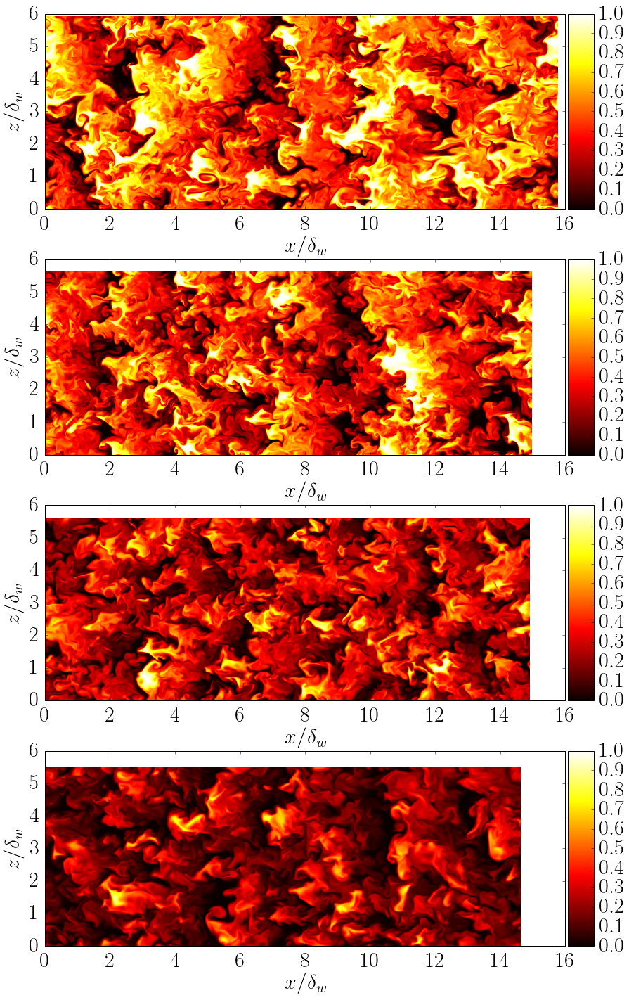

In [26]:

PRINT = True
#fformat = '.png'
pc = list(np.zeros(len(v_names)))
scase = [1,2,4,8]
vDT = [ 1.  ,    0.75 ,   1.875 ,  3.9375]
vTmin = [0.,   7.50000000e-01 ,  6.25000000e-01,   5.62500000e-01]
scaling = 'dw'
xlen = 14
ylen = 6
fig , axv = plt.subplots(len(v_names),1,figsize=(xlen,ylen*len(v_names)))
xlabel=r'$x/\delta_w$'
ylabel=r'$z/\delta_w$'
for i,name in zip(range(len(v_names)),v_names):
    z = data[name]['z']/data[name][scaling]
    x = data[name]['x']/data[name][scaling]
#fig, ax = plt.subplots()
    ff = np.array(data[name][var])
    nny, nnx = np.shape(ff)
    ff = (ff-vTmin[i])/vDT[i]
    print "min value =%s, max value = %s" %(np.nanmin(ff),np.nanmax(ff))
    #mean = np.mean(ff,axis=1)
    #for jj in range(nny):
    #ff2[jj,:]=ff[jj,:]-mean[jj]
    print "plane at %s" %(data[name]['y'])
    #coolwarm
    #pc[i] = axv[i].imshow(ff,extent=(x.min(), x.max(), z.min(), z.max()),interpolation='bicubic',\
    #                      cmap=cm.hot,origin='lower',vmin=0,vmax=1.0)
    pc[i] = axv[i].pcolormesh(x,z,ff,cmap=cm.hot,shading='bicubic',vmin=0,vmax=1)
    axv[i].set_xlim([0,16])
    axv[i].set_aspect('equal', 'box')
    axv[i].set_xlabel(xlabel);
    axv[i].set_ylabel(ylabel);
    #axv[i].set_xlim([0,10])
    #axv[i].set_ylim([0,3.5])
    stitle="%s at y=%s for s=%s, time = %s, delta=%s" % (var,data[name]['y'],scase[i],data[name]['time'],\
                                                        data[name][scaling])
    print stitle
    #axv[i].set_title(stitle)

    divider = make_axes_locatable(axv[i])
    cax = divider.append_axes("right", size="5%", pad=0.05)
    c = plt.colorbar(pc[i],cax=cax) 
#cbar = fig.colorbar(cax, ticks=[-0.5, 0, 0.5])
                         
#fig.tight_layout()
figname = 'theta_xz_y0HOT';figname='fig13'
if PRINT == True:
    pathname = save_folder + figname+ fformat
    print "Figure saved at = %s" %(pathname)
    fig.savefig(pathname,bbox_inches='tight')                    
    #plt.clf()                         

min value =-0.00264067947865, max value = 1.00327312946
plane at 0.0
Tf at y=0.0 for s=1, time = 399.842, delta=29.2303972998
min value =-0.00492970148722, max value = 1.00114599864
plane at 0.0
Tf at y=0.0 for s=2, time = 418.846, delta=30.7833095235
min value =-0.00125109354655, max value = 0.991106923421
plane at 0.0
Tf at y=0.0 for s=4, time = 455.564, delta=30.9288376628
min value =-0.000206856500535, max value = 0.907292320615
plane at 0.0
Tf at y=0.0 for s=8, time = 569.637, delta=31.5409215549
Figure saved at = /share/drive/toni/VDML/JFM/fields/thetap2_xz_ypeak2.eps


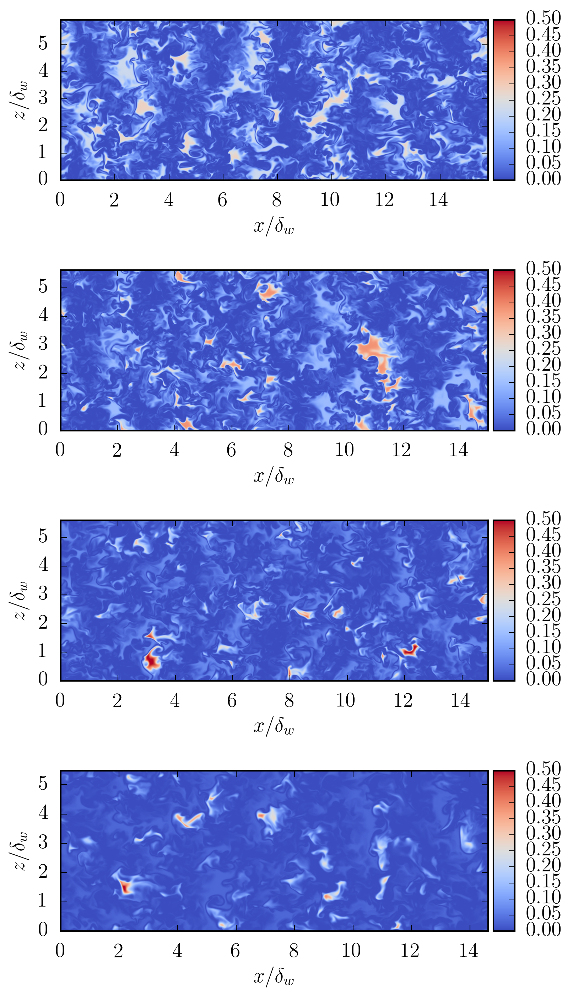

In [169]:
PRINT = True
pc = list(np.zeros(len(v_names)))
scase = [1,2,4,8]
vDT = [ 1.  ,    0.75 ,   1.875 ,  3.9375]
vTmin = [0.,   7.50000000e-01 ,  6.25000000e-01,   5.62500000e-01]
scaling = 'dw'
fig , axv = plt.subplots(len(v_names),1,figsize=(xlen,0.4*ylen*len(v_names)))
xlabel=r'$x/\delta_w$'
ylabel=r'$z/\delta_w$'
for i,name in zip(range(len(v_names)),v_names):
    z = data[name]['z']/data[name][scaling]
    x = data[name]['x']/data[name][scaling]
#fig, ax = plt.subplots()
    ff = np.array(data[name][var])
    nny, nnx = np.shape(ff)
    ff = (ff-vTmin[i])/vDT[i]
    print "min value =%s, max value = %s" %(np.nanmin(ff),np.nanmax(ff))
    mean = np.mean(ff[:])
    ff = (ff - mean)**2
    print "plane at %s" %(data[name]['y'])
    pc[i] = axv[i].imshow(ff,extent=(x.min(), x.max(), z.min(), z.max()),interpolation='bicubic',\
                          cmap=cm.coolwarm,origin='lower',vmin=0,vmax=0.5)
    axv[i].set_aspect('equal', 'datalim')
    axv[i].set_xlabel(xlabel);
    axv[i].set_ylabel(ylabel);
    stitle="%s at y=%s for s=%s, time = %s, delta=%s" % (var,data[name]['y'],scase[i],data[name]['time'],\
                                                        data[name][scaling])
    print stitle
    #axv[i].set_title(stitle)

    divider = make_axes_locatable(axv[i])
    cax = divider.append_axes("right", size="5%", pad=0.05)
    c = plt.colorbar(pc[i],cax=cax) 
#cbar = fig.colorbar(cax, ticks=[-0.5, 0, 0.5])
                         
fig.tight_layout()
figname = 'thetap2_xz_ypeak2'
if PRINT == True:
    pathname = save_folder + figname+ fformat
    print "Figure saved at = %s" %(pathname)
    fig.savefig(pathname,bbox_inches='tight')                    
                         

In [ ]:
np.reshape?

In [9]:
f.seek?

Object `f.seek` not found.


In [10]:
np.fromfile?